# IMPORTING DATASET

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
!cp "/content/drive/MyDrive/EEG_Data-20250117T094704Z-001.zip" /content/

In [4]:
!unzip -q "/content/drive/MyDrive/EEG_Data-20250117T094704Z-001.zip" -d /content/

replace /content/EEG_Data/validation_data/Video_detected_Seizures_with_no_visual_change_over_EEG/2816.npy? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# TASK 4: Basic Analysis of EEG Signals\

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy import signal

Exception ignored in: <function _get_module_lock.<locals>.cb at 0x7827d734e5c0>
Traceback (most recent call last):
  File "<frozen importlib._bootstrap>", line 198, in cb
KeyboardInterrupt: 


In [6]:
# Directory path for the train_data
base_dir = '/content/EEG_Data/train_data'

# Subdirectory names for the four classes
classes = [
    'Normal',
    'Electrographic_Seizures',
    'Complex_Partial_Seizures',
    'Video_detected_Seizures_with_no_visual_change_over_EEG'
]

# Function to load one sample .npy file from each class
def load_samples(base_dir, classes):
    samples = {}
    for class_name in classes:
        class_dir = os.path.join(base_dir, class_name)

        npy_files = [f for f in os.listdir(class_dir) if f.endswith('.npy')]
        if npy_files:
            sample_file = npy_files[0]
            sample_data = np.load(os.path.join(class_dir, sample_file))
            samples[class_name] = sample_data
    return samples

samples = load_samples(base_dir, classes)
samples

{'Normal': array([[-0.01141288, -0.01135185, -0.0109246 , ...,  0.00561594,
          0.00549387,  0.00558542],
        [ 0.00289987,  0.00283884,  0.00363229, ...,  0.00991892,
          0.0098884 ,  0.01019358],
        [-0.01028373, -0.01034477, -0.00994804, ..., -0.0005181 ,
         -0.00097586, -0.00048758],
        ...,
        [-0.00402762, -0.0032952 , -0.00241019, ...,  0.01229929,
          0.01242136,  0.01272654],
        [-0.00323417, -0.00353934, -0.00347831, ...,  0.00735544,
          0.0081489 ,  0.00845408],
        [-0.00378348, -0.00323417, -0.00250174, ...,  0.01034617,
          0.01083445,  0.01147532]]),
 'Electrographic_Seizures': array([[ 0.00094675,  0.00158762,  0.00222848, ...,  0.00097726,
          0.00076364,  0.00055002],
        [-0.0031121 , -0.00317313, -0.00308158, ...,  0.01016306,
          0.01004099,  0.00994944],
        [-0.00146414, -0.00167777, -0.00189139, ..., -0.00445487,
         -0.00454642, -0.00466849],
        ...,
        [-0.00613

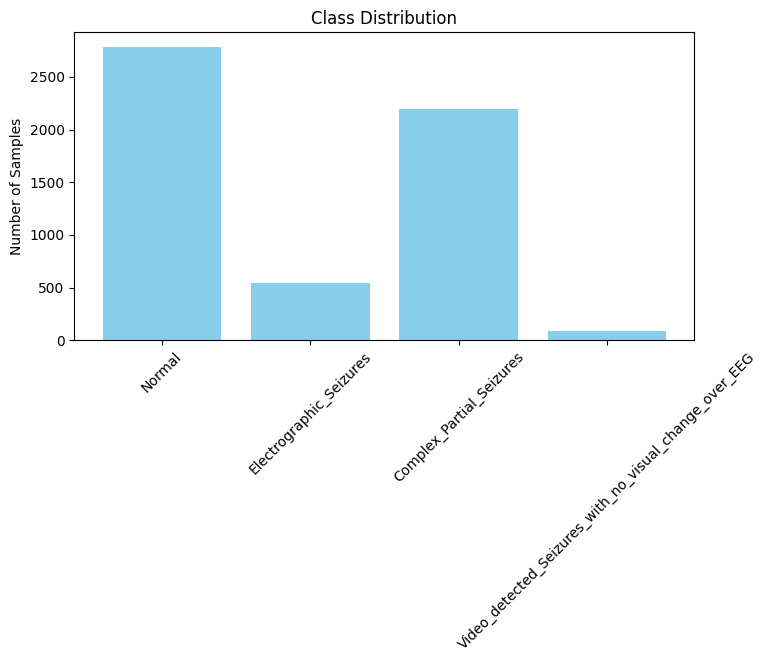

In [7]:
# Checking out the distribution of the classes in training_data
class_counts = {class_name: len(os.listdir(os.path.join(base_dir, class_name))) for class_name in samples.keys()}
plt.figure(figsize=(8, 4))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.title('Class Distribution')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.show()


Plotting EEG signals for class: Normal


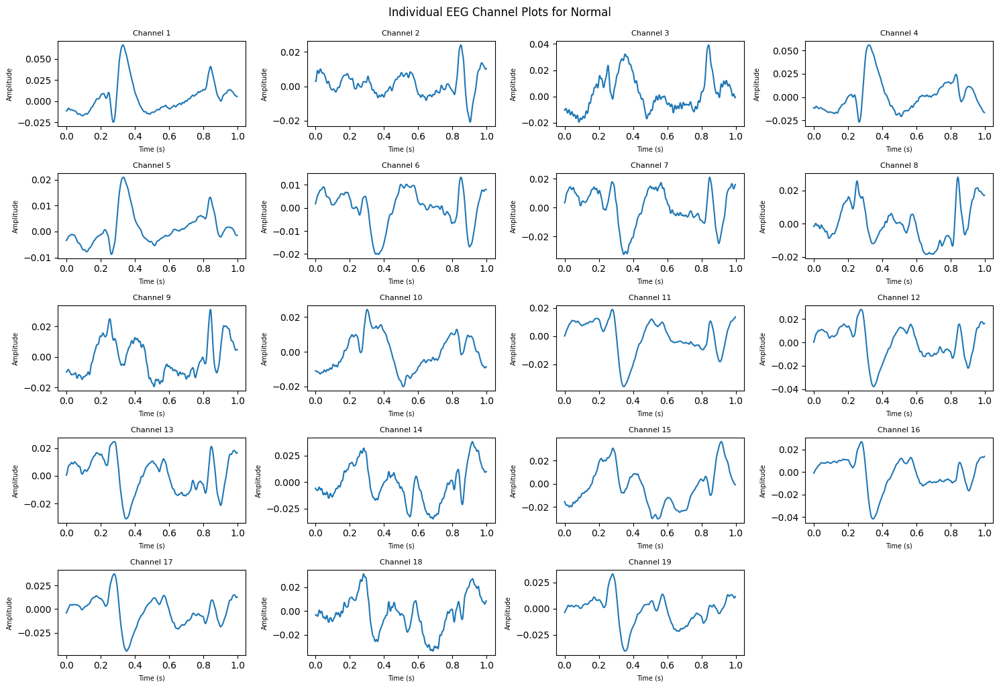

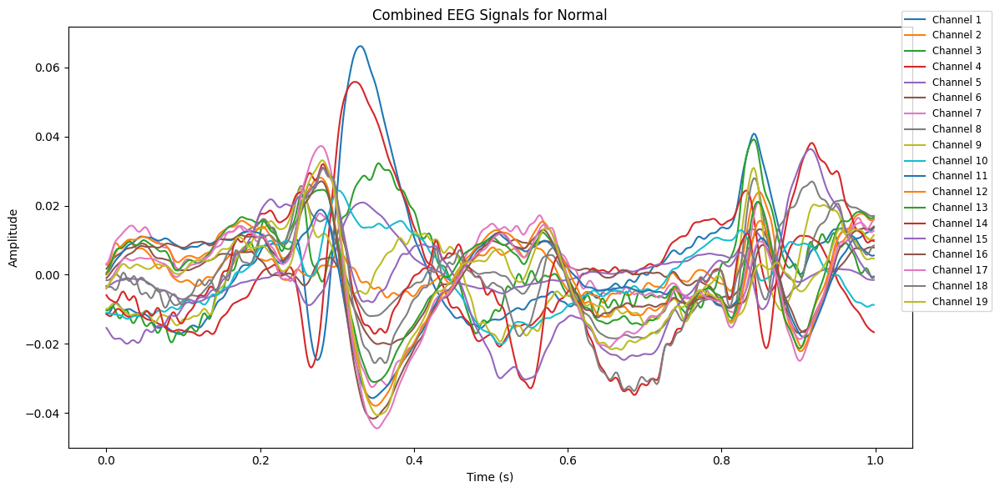


Plotting EEG signals for class: Electrographic_Seizures


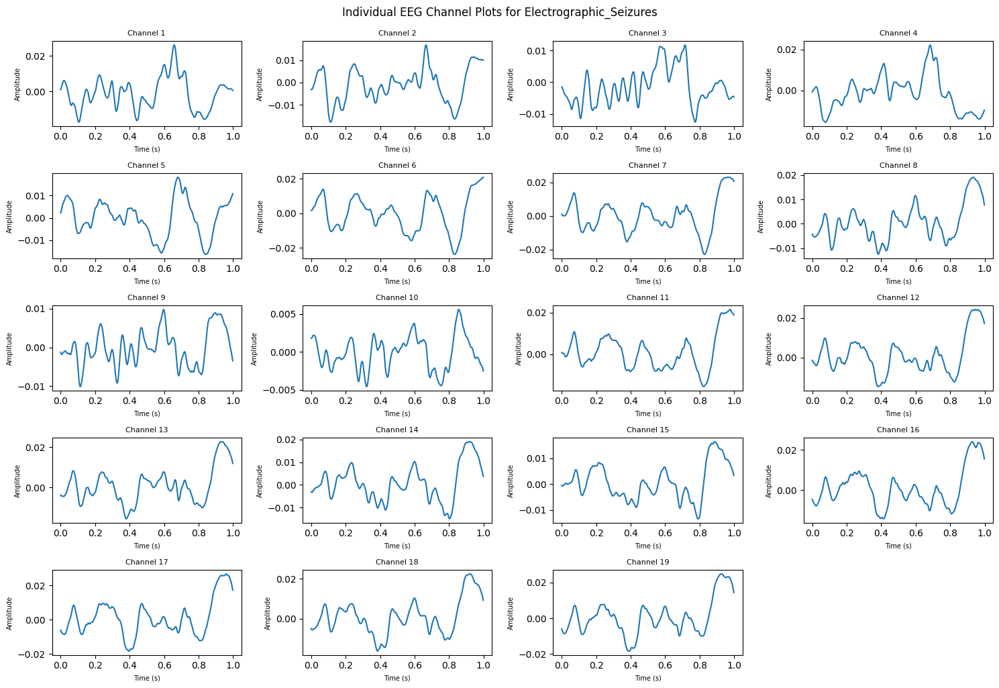

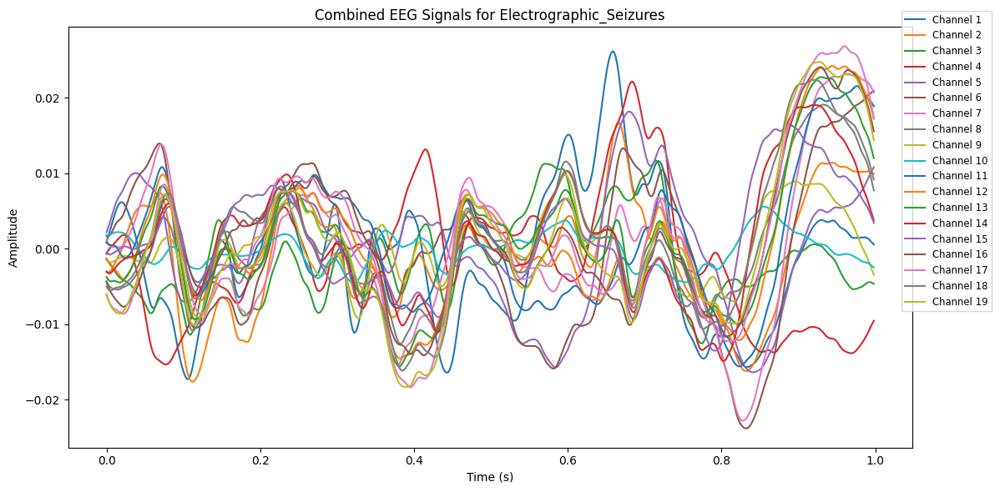


Plotting EEG signals for class: Complex_Partial_Seizures


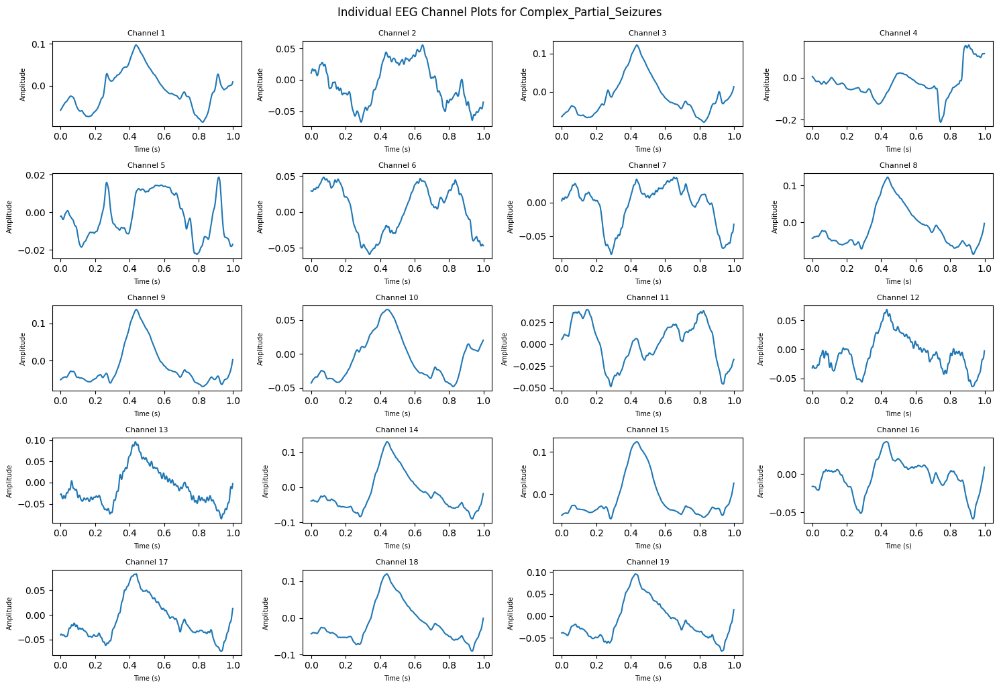

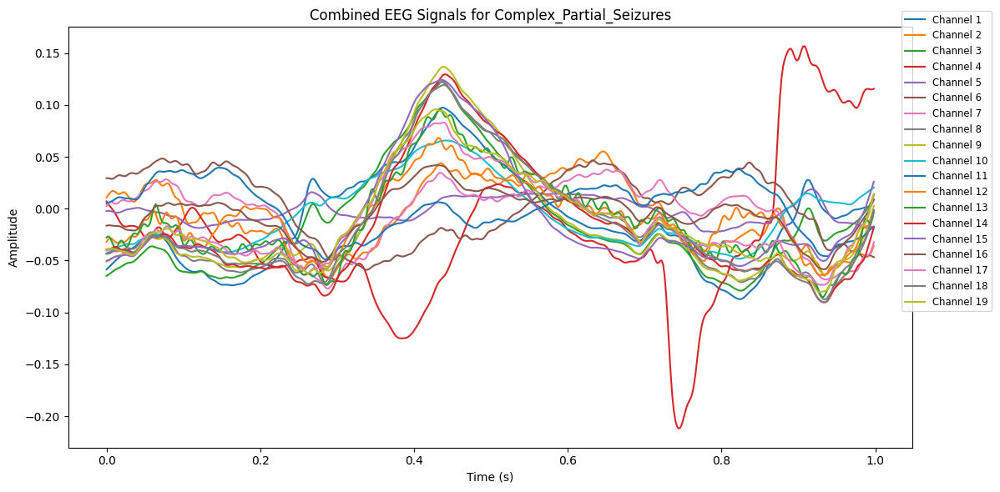


Plotting EEG signals for class: Video_detected_Seizures_with_no_visual_change_over_EEG


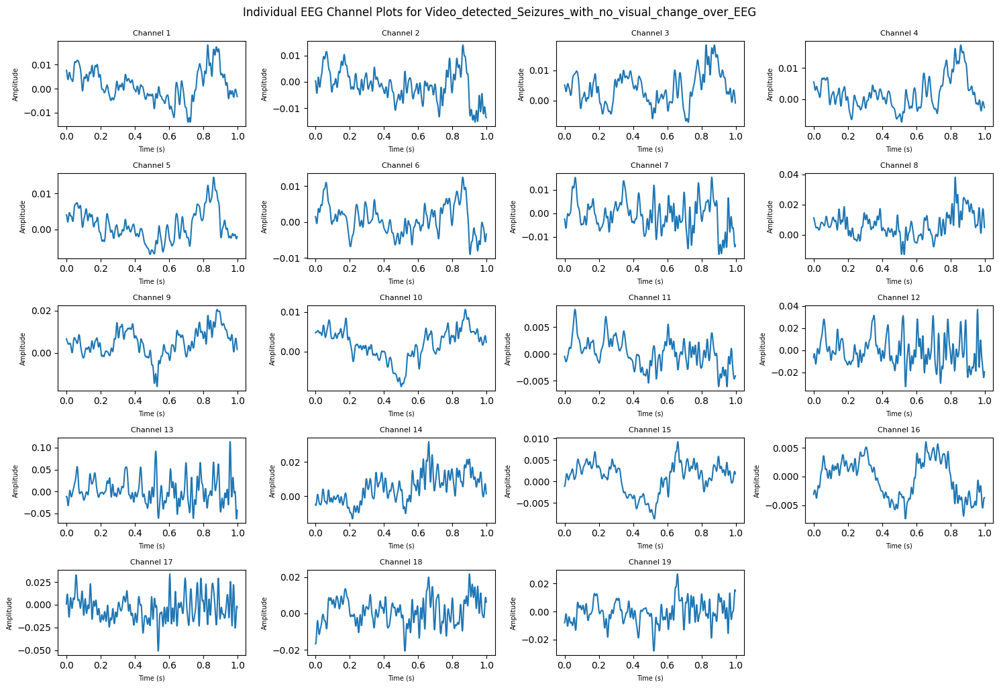

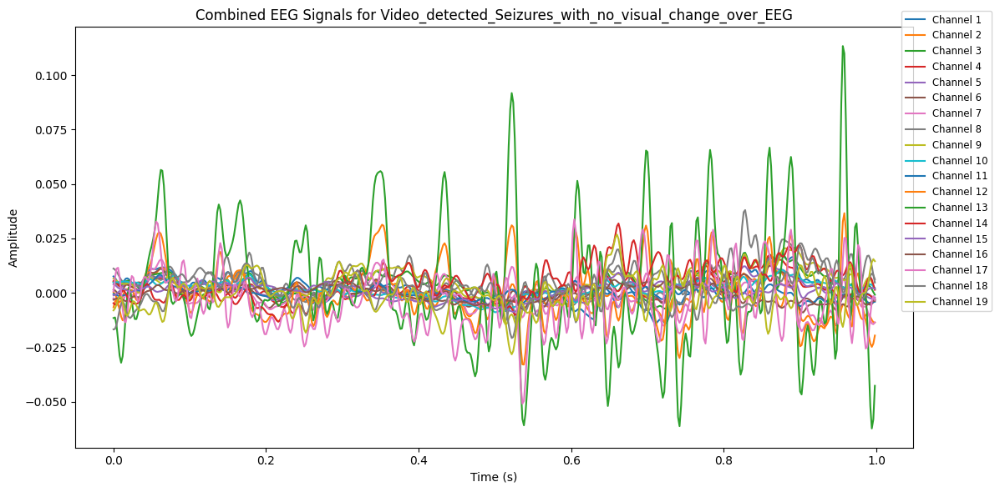

In [8]:
for class_name, data in samples.items():
    print(f"\nPlotting EEG signals for class: {class_name}")

    num_channels, time_points = data.shape
    time = np.arange(time_points) / 500

    # Individual channel plots
    plt.figure(figsize=(15, 10))
    for ch in range(num_channels):
        plt.subplot(5, 4, ch + 1)
        plt.plot(time, data[ch])
        plt.title(f'Channel {ch + 1}', fontsize=8)
        plt.xlabel('Time (s)', fontsize=7)
        plt.ylabel('Amplitude', fontsize=7)
    plt.tight_layout()
    plt.suptitle(f'Individual EEG Channel Plots for {class_name}', y=1.02)
    plt.show()

    # Combined plot of all channels
    plt.figure(figsize=(12, 6))
    for ch in range(num_channels):
        plt.plot(time, data[ch], label=f'Channel {ch + 1}')
    plt.title(f'Combined EEG Signals for {class_name}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.05), fontsize='small')
    plt.tight_layout()
    plt.show()




1.**Zero Crossing Rate:**  

A high zero crossing rate may indicate more frequent brain activity or rapid oscillations, which could be important for detecting abnormal brain states, such as seizures.**bold text**

2.**Range** :

It reflects the signal's variability. A larger range might indicate more dynamic or variable brain activity, while a smaller range could suggest stable or less fluctuating activity. Range helps distinguish between different states of neural activity.

3.**Energy**:

It is an important measure because it quantifies the intensity of the signal and reflects the overall level of brain activity. Energy is often used in identifying seizure events or periods of high neural activity.

4.**RMS**:

It is useful for assessing the strength or intensity of brain activity in different states, helping differentiate between normal and abnormal activity, such as during seizures or non-seizure states.

5.**Variance**:

Variance helps identify moments of instability or irregularity in the EEG, such as during seizures or complex brain functions.



In [9]:
!pip install tabulate

In [10]:
from tabulate import tabulate

def compute_metrics(data):
    metrics_list = []
    for ch_data in data:
        metrics = {
            'Mean': np.mean(ch_data),
            'Zero Crossing Rate': ((ch_data[:-1] * ch_data[1:]) < 0).sum(),
            'Range': np.ptp(ch_data),
            'Energy': np.sum(ch_data**2),
            'RMS': np.sqrt(np.mean(ch_data**2)),
            'Variance': np.var(ch_data)
        }
        metrics_list.append(metrics)
    return metrics_list

# Compute and displaying metrics for each class in tabular format
for class_name, data in samples.items():
    print(f"\nTime Domain Metrics for Class: {class_name}")
    metrics = compute_metrics(data)

    table_data = []
    headers = ["Channel", "Mean", "Zero Crossing Rate", "Range", "Energy", "RMS", "Variance"]

    for ch_index, ch_metrics in enumerate(metrics, start=1):
        row = [ch_index] + [f"{value:.4f}" for value in ch_metrics.values()]
        table_data.append(row)

    # Displaying table with tabulate
    print(tabulate(table_data, headers=headers, tablefmt="grid"))



Time Domain Metrics for Class: Normal
+-----------+---------+----------------------+---------+----------+--------+------------+
|   Channel |    Mean |   Zero Crossing Rate |   Range |   Energy |    RMS |   Variance |
+===========+=========+======================+=========+==========+========+============+
|         1 |  0.004  |                    7 |  0.0909 |   0.1814 | 0.019  |     0.0003 |
+-----------+---------+----------------------+---------+----------+--------+------------+
|         2 |  0.0011 |                   16 |  0.0447 |   0.0249 | 0.0071 |     0      |
+-----------+---------+----------------------+---------+----------+--------+------------+
|         3 |  0.0021 |                   14 |  0.0588 |   0.0923 | 0.0136 |     0.0002 |
+-----------+---------+----------------------+---------+----------+--------+------------+
|         4 |  0.0012 |                    8 |  0.0827 |   0.1549 | 0.0176 |     0.0003 |
+-----------+---------+----------------------+---------+-----



####   "It provides insight into the baseline level of brain activity and can help identify any overall trends, such as shifts in the brain's electrical activity."



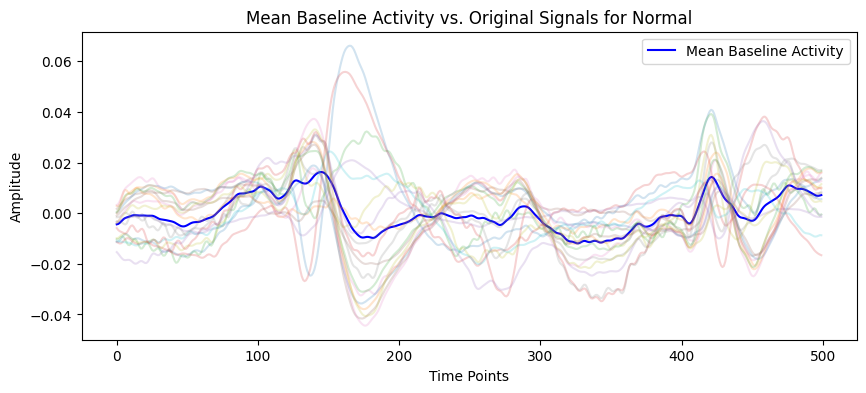

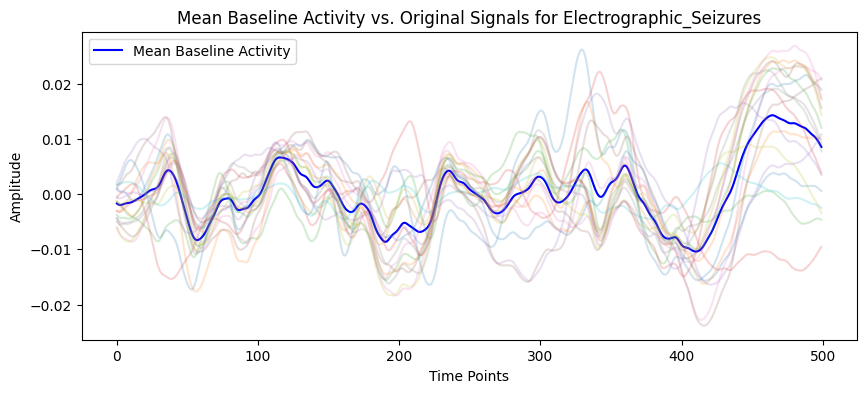

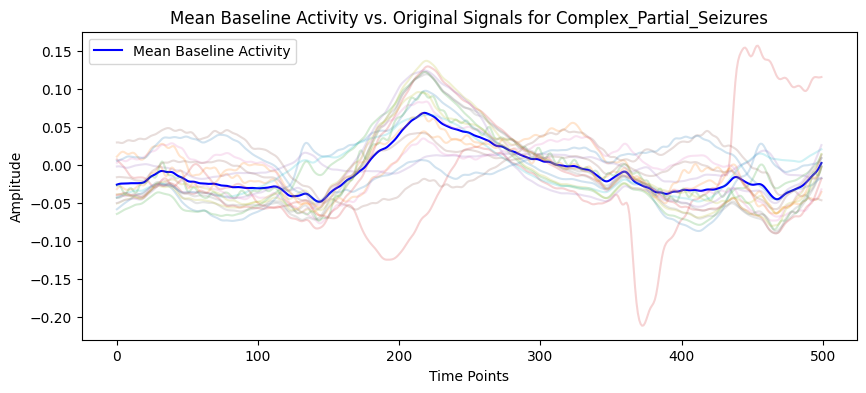

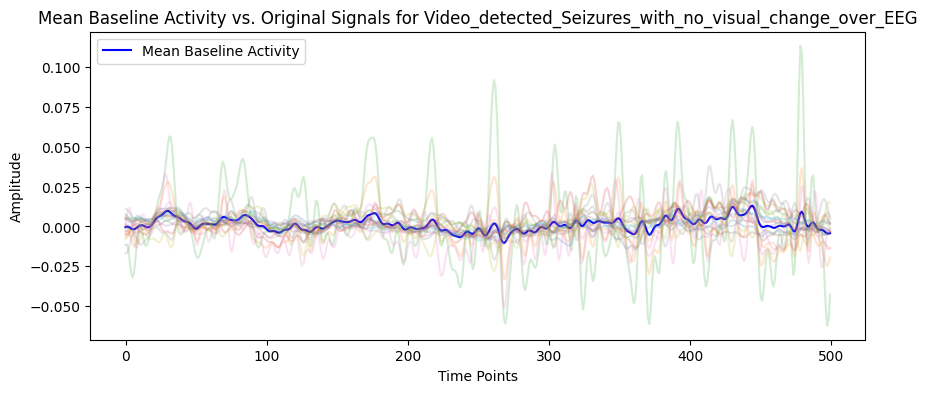

In [11]:
for class_name, data in samples.items():
    mean_baseline = np.mean(data, axis=0)
    plt.figure(figsize=(10, 4))
    plt.plot(mean_baseline, label='Mean Baseline Activity', color='blue')
    plt.plot(data.T, alpha=0.2)
    plt.title(f'Mean Baseline Activity vs. Original Signals for {class_name}')
    plt.xlabel('Time Points')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()

### Final Insight:
**A.Seizure Detection:**

The significant increase in metrics such as ZCR, Energy, and RMS across seizure classes (Electrographic Seizures, Complex Partial Seizures, and Video-detected Seizures) compared to the normal class highlights the heightened neural activity during seizures. The variance, range, and zero crossing rates also show larger fluctuations and more dynamic changes in EEG patterns during seizures.

**B.Class Differences:**

 Video-detected Seizures (with no visible change) have the most extreme variations, particularly in terms of mean, energy, and RMS. This suggests that even when no visible changes occur, the electrical activity in the brain can still exhibit seizure-like characteristics.

**C.Channel Behavior:**

Certain channels, particularly in the Video-detected Seizures and Electrographic Seizures classes, show significantly higher values across various metrics, indicating these areas may be more affected during seizure events. Specific channels such as Channel 3 (in Video-detected Seizures) show extreme values across all metrics, which may highlight critical regions for seizure onset or propagation.

# TASK 5: Extracting Frequency Domain Features

In [12]:
!pip install PyWavelets

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
from scipy.fft import fft, fftfreq
from scipy.signal import spectrogram

In [14]:
def load_eeg_data_from_directory(base_dir, classes):
    eeg_data_by_class = {}

    for class_name in classes:
        class_dir = os.path.join(base_dir, class_name)
        eeg_data_by_class[class_name] = []

        for file_name in os.listdir(class_dir):
            if file_name.endswith('.npy'):
                file_path = os.path.join(class_dir, file_name)


                eeg_data = np.load(file_path)
                eeg_data_by_class[class_name].append(eeg_data)


        eeg_data_by_class[class_name] = np.array(eeg_data_by_class[class_name])

    return eeg_data_by_class

eeg_data = load_eeg_data_from_directory(base_dir, classes)
eeg_data

{'Normal': array([[[-1.14128822e-02, -1.13518470e-02, -1.09246006e-02, ...,
           5.61593831e-03,  5.49386791e-03,  5.58542071e-03],
         [ 2.89987195e-03,  2.83883675e-03,  3.63229434e-03, ...,
           9.91891983e-03,  9.88840223e-03,  1.01935782e-02],
         [-1.02837310e-02, -1.03447662e-02, -9.94803743e-03, ...,
          -5.18099190e-04, -9.75863183e-04, -4.87581591e-04],
         ...,
         [-4.02762313e-03, -3.29520074e-03, -2.41019036e-03, ...,
           1.22992926e-02,  1.24213630e-02,  1.27265390e-02],
         [-3.23416554e-03, -3.53934154e-03, -3.47830634e-03, ...,
           7.35544148e-03,  8.14889906e-03,  8.45407506e-03],
         [-3.78348234e-03, -3.23416554e-03, -2.50174316e-03, ...,
           1.03461662e-02,  1.08344478e-02,  1.14753174e-02]],
 
        [[-1.51887996e-04, -3.04475994e-04, -4.26546392e-04, ...,
          -7.31722387e-04, -5.48616790e-04, -4.26546392e-04],
         [ 3.66911195e-04,  3.66911195e-04,  4.58463993e-04, ...,
           

In [15]:
# Function to calculate Fourier features
def calculate_fourier_features(eeg_data):
    fourier_features = {}

    for class_label, class_data in eeg_data.items():
        class_features = []

        for sample in class_data:
            sample_features = []

            for channel in sample:
                # Fourier Transform
                fft_vals = np.fft.fft(channel)
                fft_power = np.abs(fft_vals)**2  # Power spectral density (PSD)

                # Extract meaningful features
                dominant_freq = np.argmax(fft_power)  # Dominant frequency index
                total_power = np.sum(fft_power)  # Total power of the spectrum
                sample_features.append([dominant_freq, total_power])

            class_features.append(sample_features)

        fourier_features[class_label] = np.array(class_features)

    return fourier_features


In [16]:
# Function to calculate Wavelet features
def calculate_wavelet_features(eeg_data, wavelet='db4', levels=4):
    wavelet_features = {}

    for class_label, class_data in eeg_data.items():
        class_features = []

        for sample in class_data:
            sample_features = []

            for channel in sample:
                coeffs = pywt.wavedec(channel, wavelet, level=levels)
                wavelet_energy = [np.sum(c**2) for c in coeffs]  # Energy of each coefficient

                # Separate Approximation and Detail Coefficients
                approx_energy = wavelet_energy[0]  # Approximation at the highest level
                detail_energy = wavelet_energy[1:]  # Details at all levels
                sample_features.append([approx_energy, *detail_energy])

            class_features.append(sample_features)

        wavelet_features[class_label] = np.array(class_features)
    return wavelet_features

In [17]:

fourier_features = calculate_fourier_features(eeg_data)
wavelet_features = calculate_wavelet_features(eeg_data)

In [18]:
# Converting to DataFrame for better readability

levels = 4

fourier_features_df = {
    class_label: pd.DataFrame(
        data.reshape(-1, 2 * data.shape[1]),
        columns=[f'Channel_{i+1}_DominantFreq' if j == 0 else f'Channel_{i+1}_TotalPower'
                 for i in range(data.shape[1]) for j in range(2)]
    )
    for class_label, data in fourier_features.items()
}

wavelet_features_df = {
    class_label: pd.DataFrame(
        data.reshape(-1, (1 + levels) * data.shape[1]),
        columns=[
            f'Channel_{i+1}_ApproxEnergy' if j == 0 else f'Channel_{i+1}_DetailLevel{j}'
            for i in range(data.shape[1]) for j in range(levels + 1)
        ]
    )
    for class_label, data in wavelet_features.items()
}


In [19]:
# Displaying features
for class_label, df in fourier_features_df.items():
    print(f"\nFourier Features for class: {class_label}")
    print(df.head())


Fourier Features for class: Normal
   Channel_1_DominantFreq  Channel_1_TotalPower  Channel_2_DominantFreq  \
0                     2.0             90.723436                     4.0   
1                     4.0              0.315144                     4.0   
2                   498.0             43.068910                   497.0   
3                     1.0             83.089367                     2.0   
4                     0.0             37.222049                     1.0   

   Channel_2_TotalPower  Channel_3_DominantFreq  Channel_3_TotalPower  \
0             12.459687                     2.0             46.161277   
1              0.337429                     4.0              1.958504   
2             25.074687                   499.0             40.600640   
3              5.367596                     1.0             56.256454   
4             15.286877                     1.0             31.256569   

   Channel_4_DominantFreq  Channel_4_TotalPower  Channel_5_DominantFreq  \

In [20]:
for class_label, df in wavelet_features_df.items():
    print(f"\nWavelet Features for class: {class_label}")
    print(df.head())


Wavelet Features for class: Normal
   Channel_1_ApproxEnergy  Channel_1_DetailLevel1  Channel_1_DetailLevel2  \
0                0.188173                0.002374                0.000263   
1                0.000581                0.000032                0.000027   
2                0.093749                0.000711                0.000203   
3                0.184000                0.000755                0.000185   
4                0.080661                0.000399                0.000072   

   Channel_1_DetailLevel3  Channel_1_DetailLevel4  Channel_2_ApproxEnergy  \
0                0.000023            4.360939e-07                0.026673   
1                0.000011            2.537002e-07                0.000677   
2                0.000043            1.027760e-06                0.061845   
3                0.000059            9.521324e-07                0.013824   
4                0.000015            2.936823e-07                0.029922   

   Channel_2_DetailLevel1  Channel_2_D

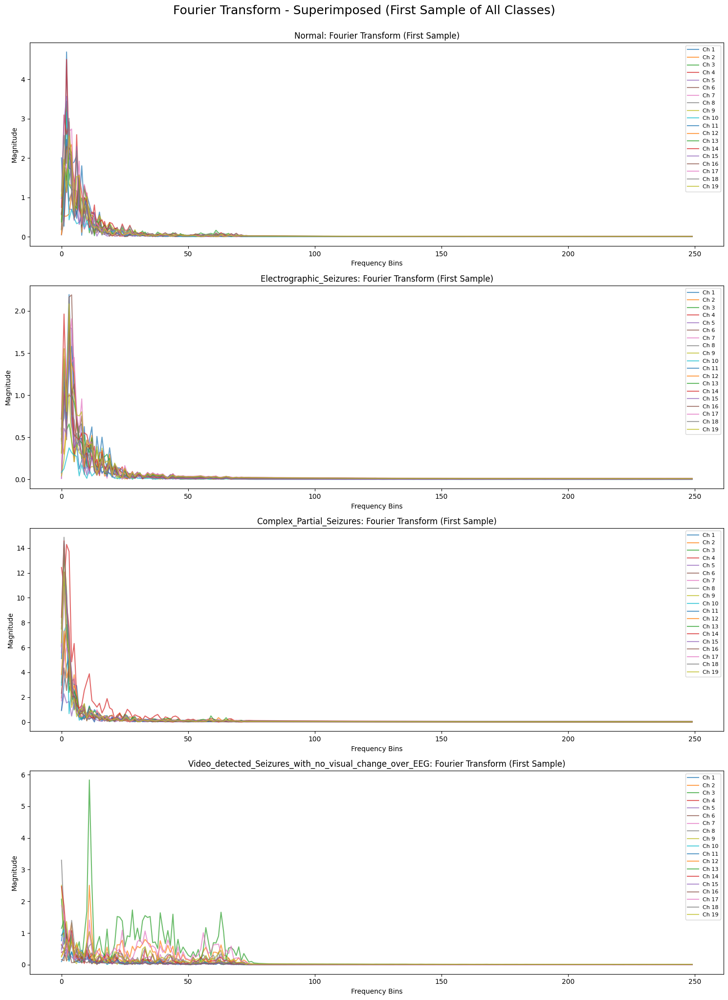

In [21]:
def visualize_fourier_transform_superimposed(eeg_data):

    plt.figure(figsize=(15, 20))
    class_names = list(eeg_data.keys())

    for class_idx, class_name in enumerate(class_names):
        first_sample = eeg_data[class_name][0]  # First sample of the current class

        # Superimpose Fourier Transforms
        plt.subplot(len(class_names), 1, class_idx + 1)
        for channel_idx, channel_data in enumerate(first_sample):
            # Compute Fourier Transform
            fft_result = np.fft.fft(channel_data)
            fft_magnitude = np.abs(fft_result)[:len(fft_result) // 2]  # Magnitude of FFT
            plt.plot(fft_magnitude, label=f"Ch {channel_idx + 1}", alpha=0.7)
        plt.title(f"{class_name}: Fourier Transform (First Sample)")
        plt.xlabel("Frequency Bins")
        plt.ylabel("Magnitude")
        plt.legend(loc='upper right', fontsize=8)

    plt.tight_layout()
    plt.suptitle("Fourier Transform - Superimposed (First Sample of All Classes)", y=1.02, fontsize=18)
    plt.show()



visualize_fourier_transform_superimposed(eeg_data)


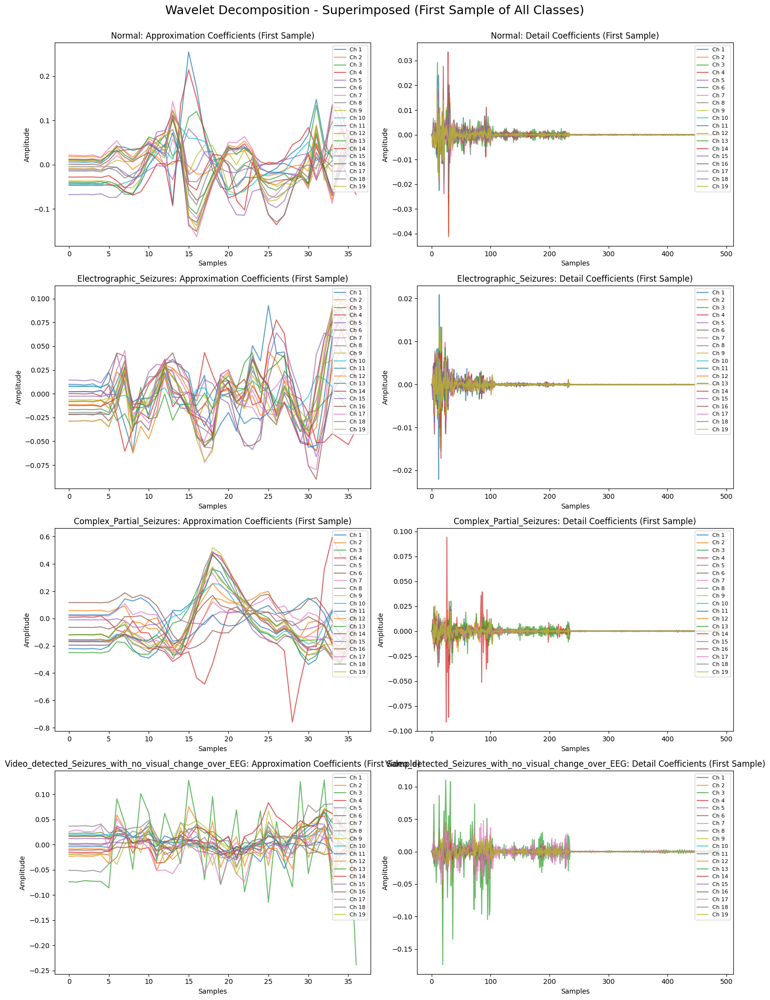

In [22]:
def visualize_wavelet_decomposition_superimposed(eeg_data, wavelet='db4', levels=4):

    plt.figure(figsize=(15, 20))
    class_names = list(eeg_data.keys())

    for class_idx, class_name in enumerate(class_names):
        first_sample = eeg_data[class_name][0]  # First sample of the current class

        # Superimpose Approximation Coefficients
        plt.subplot(len(class_names), 2, 2 * class_idx + 1)
        for channel_idx, channel_data in enumerate(first_sample):
            coeffs = pywt.wavedec(channel_data, wavelet, level=levels)
            approx_coeffs = coeffs[0]
            plt.plot(approx_coeffs, label=f"Ch {channel_idx + 1}", alpha=0.7)
        plt.title(f"{class_name}: Approximation Coefficients (First Sample)")
        plt.xlabel("Samples")
        plt.ylabel("Amplitude")
        plt.legend(loc='upper right', fontsize=8)

        # Superimpose Detail Coefficients (Combining All Levels)
        plt.subplot(len(class_names), 2, 2 * class_idx + 2)
        for channel_idx, channel_data in enumerate(first_sample):
            coeffs = pywt.wavedec(channel_data, wavelet, level=levels)
            detail_coeffs_combined = np.concatenate(coeffs[1:])
            plt.plot(detail_coeffs_combined, label=f"Ch {channel_idx + 1}", alpha=0.7)
        plt.title(f"{class_name}: Detail Coefficients (First Sample)")
        plt.xlabel("Samples")
        plt.ylabel("Amplitude")
        plt.legend(loc='upper right', fontsize=8)

    plt.tight_layout()
    plt.suptitle("Wavelet Decomposition - Superimposed (First Sample of All Classes)", y=1.02, fontsize=18)
    plt.show()



visualize_wavelet_decomposition_superimposed(eeg_data)


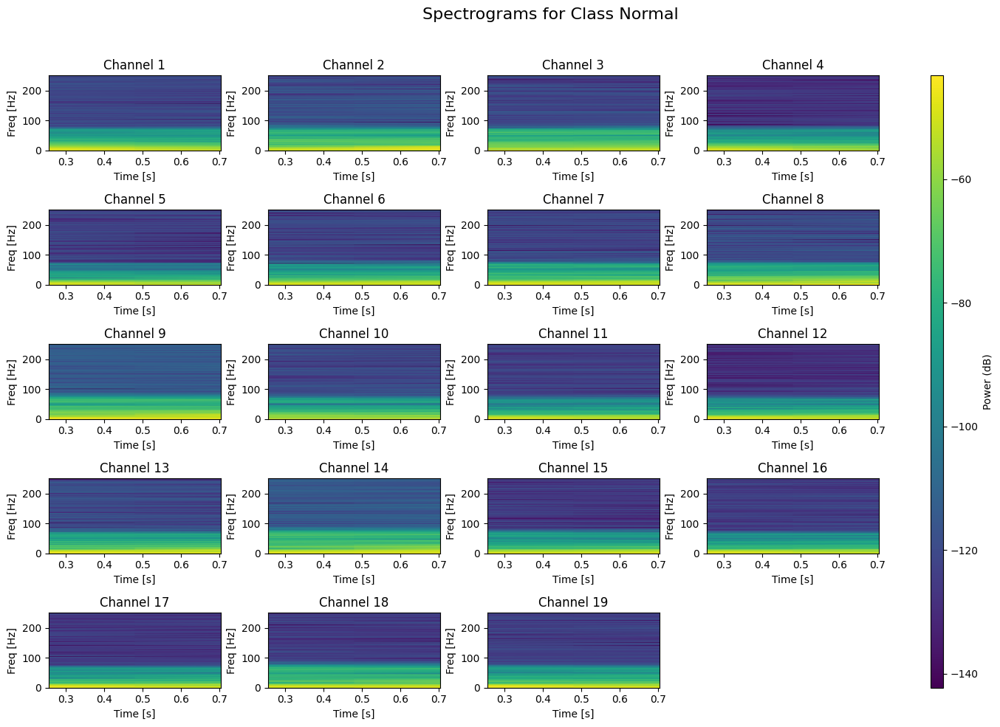

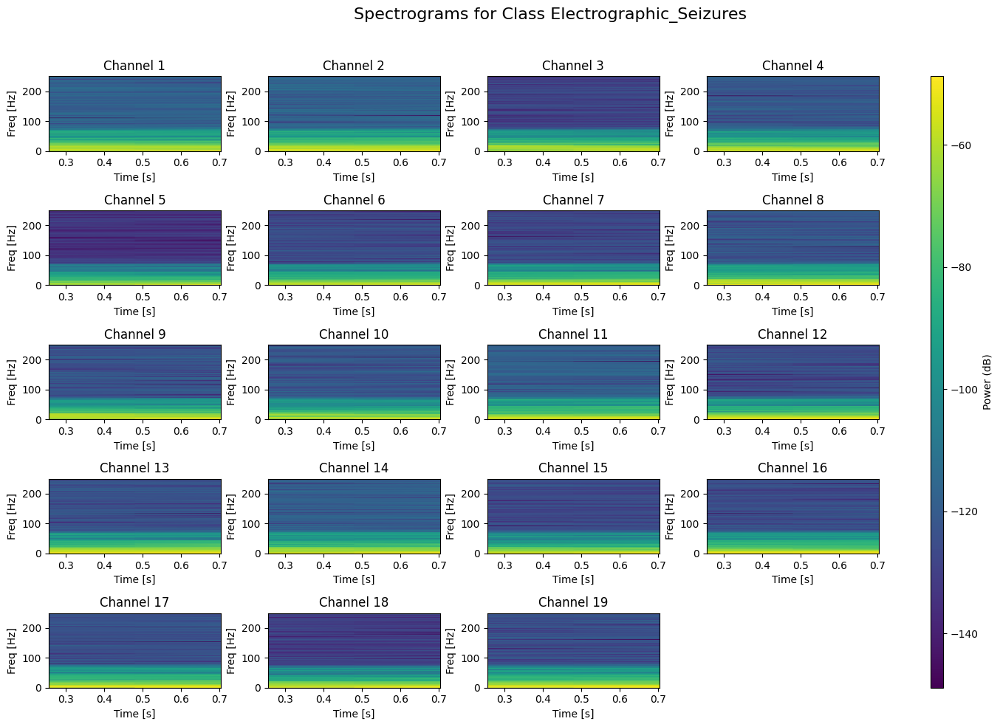

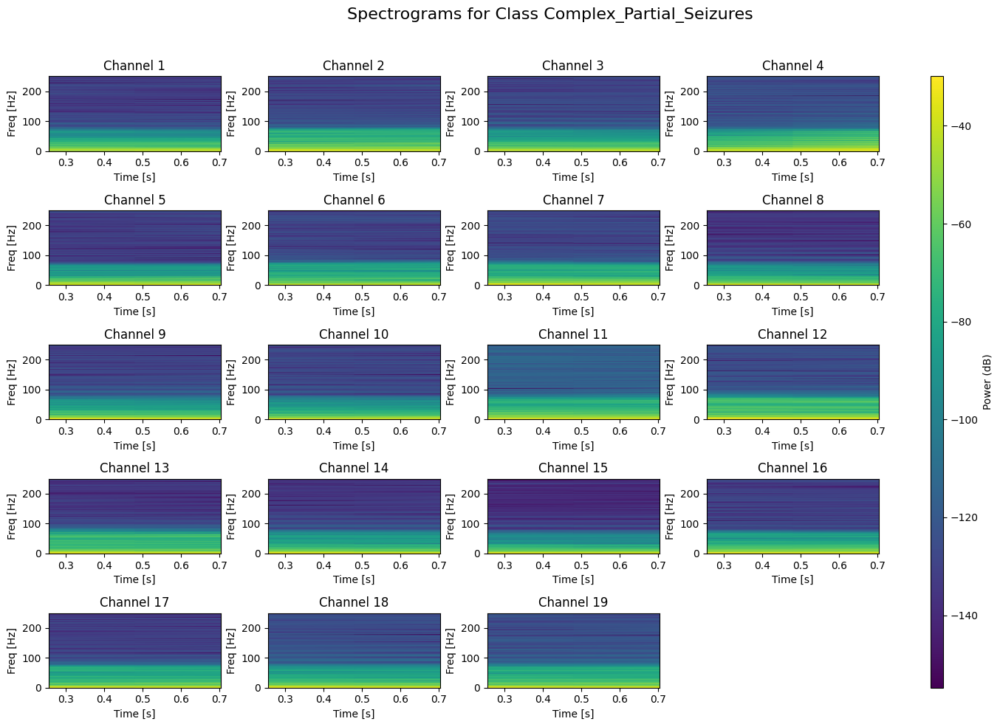

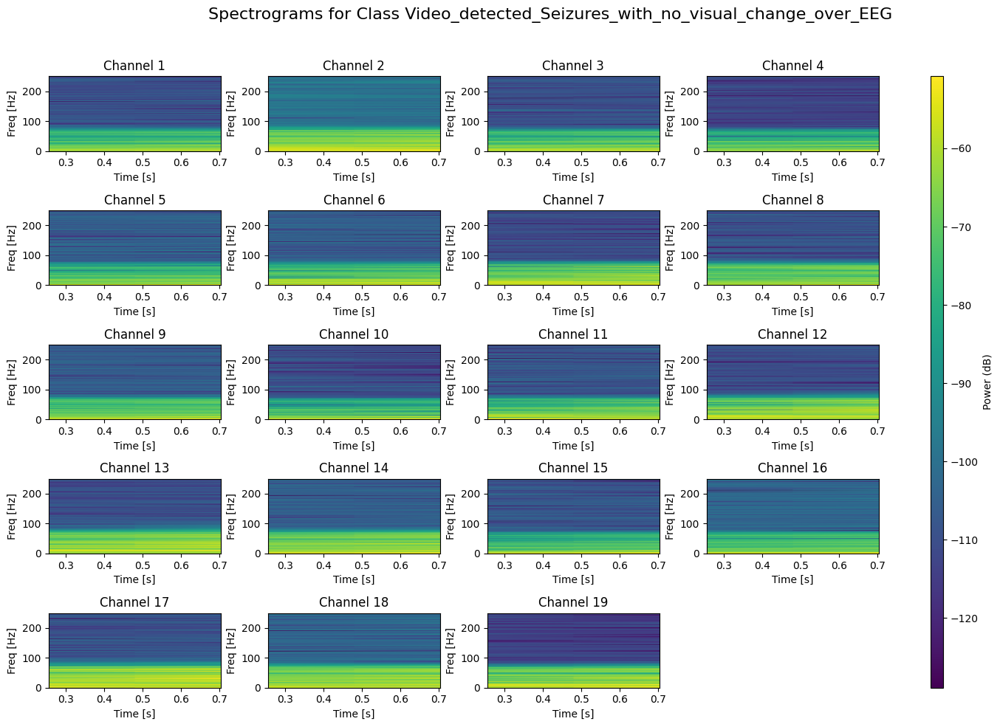

In [23]:
from scipy.signal import spectrogram

# Function to generate spectrograms for all channels of a single sample
def generate_spectrograms_from_sample(samples):
    for class_name, data in samples.items():
        plt.figure(figsize=(15, 10))
        for i, channel in enumerate(data):
            plt.subplot(5, 4, i + 1)
            f, t, Sxx = spectrogram(channel, fs=500)
            plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
            plt.title(f"Channel {i + 1}")
            plt.ylabel('Freq [Hz]')
            plt.xlabel('Time [s]')
        plt.suptitle(f"Spectrograms for Class {class_name}", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.colorbar(label='Power (dB)', ax=plt.gcf().axes, orientation='vertical', aspect=50)
        plt.show()

generate_spectrograms_from_sample(samples)


**REASON**

Spectrograms are used in EEG analysis because they show how the signal's frequency components change over time, which is crucial for detecting non-stationary events like seizures. Seizures often have distinct frequency patterns, such as abnormal spikes or bursts, that can be identified in specific frequency bands. By generating spectrograms for each EEG channel, you can see which brain regions are affected and when. They’re also great for extracting features like power and entropy for machine learning models, which can automate seizure detection. Overall, spectrograms provide a clear, visual way to analyze and classify EEG signals.

#TASK 6: Building the Baseline Model

In [24]:
def calculate_zero_crossing_rate(eeg_data):
    features = {}

    for class_label, class_data in eeg_data.items():
        class_features = []


        for sample_idx, sample in enumerate(class_data):
            sample_features = []


            for channel in sample:
                zero_crossings = np.sum(np.diff(np.sign(channel)) != 0)
                zcr = zero_crossings / len(channel)
                sample_features.append(zcr)

            class_features.append(sample_features)

        features[class_label] = np.array(class_features)
    return features


zcr_features = calculate_zero_crossing_rate(eeg_data)

# Convert to a DataFrame for better readability
zcr_features_df = {
    class_label: pd.DataFrame(data, columns=[f'Channel_{i+1}' for i in range(data.shape[1])])
    for class_label, data in zcr_features.items()
}

# display the ZCR features
for class_label, df in zcr_features_df.items():
    print(f"\nZero Crossing Rate for class: {class_label}")
    print(df.head())



Zero Crossing Rate for class: Normal
   Channel_1  Channel_2  Channel_3  Channel_4  Channel_5  Channel_6  \
0      0.014      0.032      0.028      0.016      0.016      0.028   
1      0.032      0.036      0.024      0.050      0.018      0.014   
2      0.014      0.018      0.014      0.014      0.014      0.010   
3      0.018      0.022      0.016      0.018      0.018      0.022   
4      0.012      0.018      0.012      0.012      0.030      0.014   

   Channel_7  Channel_8  Channel_9  Channel_10  Channel_11  Channel_12  \
0      0.016      0.022      0.014       0.016       0.012       0.012   
1      0.014      0.024      0.034       0.022       0.014       0.050   
2      0.014      0.022      0.014       0.010       0.010       0.014   
3      0.012      0.028      0.008       0.016       0.014       0.018   
4      0.016      0.016      0.016       0.012       0.012       0.024   

   Channel_13  Channel_14  Channel_15  Channel_16  Channel_17  Channel_18  \
0       0.012

In [25]:
# Function to combine DataFrames from dictionaries
def combine_feature_dicts(feature_dict):
    combined_df = pd.DataFrame()
    for class_label, df in feature_dict.items():
        df = df.copy()
        df["class"] = class_label
        combined_df = pd.concat([combined_df, df], axis=0)
    return combined_df

# Combine Fourier and ZCR features
fourier_features_combined = combine_feature_dicts(fourier_features_df)
zcr_features_combined = combine_feature_dicts(zcr_features_df)

# Merge Fourier and ZCR features (on index)
combined_features_df = pd.merge(
    fourier_features_combined,
    zcr_features_combined.drop(columns=["class"]),
    left_index=True,
    right_index=True,
)


In [26]:
# Path to the validation directory
validation_dir = "/content/EEG_Data/validation_data"

def load_validation_data(validation_dir):
    validation_features = {}
    for class_name in os.listdir(validation_dir):
        class_path = os.path.join(validation_dir, class_name)
        if os.path.isdir(class_path):
            validation_features[class_name] = []
            for file in os.listdir(class_path):
                if file.endswith(".npy"):
                    file_path = os.path.join(class_path, file)
                    data = np.load(file_path)
                    validation_features[class_name].append(data)
            validation_features[class_name] = np.array(validation_features[class_name])
    return validation_features

# Load validation data
validation_data = load_validation_data(validation_dir)


In [27]:
def extract_features_from_validation(validation_data):
    fourier_validation_features = {}
    zcr_validation_features = {}

    for class_name, samples in validation_data.items():
        fourier_features = []
        zcr_features = []

        for sample in samples:
            # Compute Fourier features
            fft_features = np.abs(np.fft.fft(sample, axis=1)).mean(axis=1)
            fourier_features.append(fft_features)

            # Compute Zero Crossing Rate features
            zcr_features_sample = [
                np.sum(np.diff(np.sign(channel)) != 0) for channel in sample
            ]
            zcr_features.append(zcr_features_sample)


        column_names = [f"channel_{i+1}" for i in range(samples.shape[1])]

        # Store results as DataFrames with renamed columns
        fourier_validation_features[class_name] = pd.DataFrame(fourier_features, columns=column_names)
        zcr_validation_features[class_name] = pd.DataFrame(zcr_features, columns=column_names)

    return fourier_validation_features, zcr_validation_features

extracts = extract_features_from_validation(validation_data)

fourier_validation_features = extracts[0]
zcr_validation_features = extracts[1]


In [28]:
def extract_features_from_validation(validation_data):
    fourier_validation_features = {}
    zcr_validation_features = {}

    for class_name, samples in validation_data.items():
        class_features_fourier = []  # Store Fourier features for all samples in this class
        class_features_zcr = []  # Store ZCR features for all samples in this class

        for sample in samples:
            sample_features_fourier = []  # Store Fourier features for all channels in this sample
            sample_features_zcr = []  # Store ZCR features for all channels in this sample

            for channel in sample:
                # Fourier Transform
                fft_vals = np.fft.fft(channel)
                fft_power = np.abs(fft_vals)**2  # Power spectral density (PSD)

                # Extract meaningful features
                dominant_freq = np.argmax(fft_power)  # Dominant frequency index
                total_power = np.sum(fft_power)  # Total power of the spectrum
                sample_features_fourier.append([dominant_freq, total_power])

                # Compute Zero Crossing Rate features
                zero_crossings = np.sum(np.diff(np.sign(channel)) != 0)  # Count zero crossings
                zcr = zero_crossings / len(channel)  # Normalize by the number of samples
                sample_features_zcr.append(zcr)  # Append ZCR for this channel

            class_features_fourier.append(sample_features_fourier)
            class_features_zcr.append(sample_features_zcr)

        # Convert to DataFrame with consistent column names
        fourier_validation_features[class_name] = pd.DataFrame(
            data=np.array(class_features_fourier).reshape(-1, 2 * samples.shape[1]),
            columns=[f'Channel_{i+1}_DominantFreq' if j == 0 else f'Channel_{i+1}_TotalPower'
                     for i in range(samples.shape[1]) for j in range(2)]
        )

        zcr_validation_features[class_name] = pd.DataFrame(
            data=np.array(class_features_zcr),
            columns=[f'Channel_{i+1}' for i in range(samples.shape[1])]
        )

    return fourier_validation_features, zcr_validation_features

extracts = extract_features_from_validation(validation_data)

fourier_validation_features = extracts[0]
zcr_validation_features = extracts[1]

In [29]:
# Combine DataFrames for validation data
fourier_validation_combined = combine_feature_dicts(fourier_validation_features)
zcr_validation_combined = combine_feature_dicts(zcr_validation_features)

# Merge Fourier and ZCR features for validation
validation_features_df = pd.merge(
    fourier_validation_combined,
    zcr_validation_combined.drop(columns=["class"]),
    left_index=True,
    right_index=True,
)


In [30]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, roc_auc_score, balanced_accuracy_score
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Prepare training data
X_train = combined_features_df.drop(columns=["class"])
y_train = combined_features_df["class"]

# Prepare validation data
X_val = validation_features_df.drop(columns=["class"])
y_val = validation_features_df["class"]

# Encode class labels
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)

# Normalize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)

# Train SVM model
svm_model = SVC(kernel="rbf", probability=True, random_state=42)
svm_model.fit(X_train, y_train)

# Predictions and evaluation
y_pred = svm_model.predict(X_val)
y_prob = svm_model.predict_proba(X_val)

# Metrics
classification_report_result = classification_report(y_val, y_pred, target_names=label_encoder.classes_)
roc_auc = roc_auc_score(y_val, y_prob, multi_class="ovr")
balanced_acc = balanced_accuracy_score(y_val, y_pred)

# Display results
print("Classification Report:\n", classification_report_result)
print("\nROC AUC Score:", roc_auc)
print("\nBalanced Accuracy:", balanced_acc)


Classification Report:
                                                         precision    recall  f1-score   support

                              Complex_Partial_Seizures       0.92      0.74      0.82      1256
                               Electrographic_Seizures       0.88      0.75      0.81       432
                                                Normal       0.77      0.97      0.86      1403
Video_detected_Seizures_with_no_visual_change_over_EEG       0.93      0.44      0.60        84

                                              accuracy                           0.83      3175
                                             macro avg       0.87      0.72      0.77      3175
                                          weighted avg       0.85      0.83      0.83      3175


ROC AUC Score: 0.9506015786496422

Balanced Accuracy: 0.7235177133535293


# TASK 7: Building the Best Model

In [31]:
!pip install imblearn

In [32]:
from imblearn.over_sampling import SMOTE
from collections import Counter
import numpy as np

# Flatten the data and create labels
X = []
y = []

for label, data in eeg_data.items():
    for sample in data:
        X.append(sample.flatten())  # Flattening
        y.append(label)

X = np.array(X)
y = np.array(y)

# Display the class distribution before SMOTE
counter = Counter(y)
print('Before SMOTE:', counter)

smt = SMOTE()
X_sm, y_sm = smt.fit_resample(X, y)

# Display the class distribution after SMOTE
counter = Counter(y_sm)
print('After SMOTE:', counter)


X_resampled = np.array([x.reshape(19, 500) for x in X_sm])

# Convert back to a dictionary
balanced_eeg_data = {label: [] for label in np.unique(y_sm)}

for sample, label in zip(X_resampled, y_sm):
    balanced_eeg_data[label].append(sample)

# Convert lists back to numpy arrays for each class
balanced_eeg_data = {label: np.array(samples) for label, samples in balanced_eeg_data.items()}

# Verify the shapes and data distribution
for label, data in balanced_eeg_data.items():
    print(f"Class: {label}, Data shape: {data.shape}")


Before SMOTE: Counter({'Normal': 2783, 'Complex_Partial_Seizures': 2196, 'Electrographic_Seizures': 545, 'Video_detected_Seizures_with_no_visual_change_over_EEG': 84})
After SMOTE: Counter({'Normal': 2783, 'Electrographic_Seizures': 2783, 'Complex_Partial_Seizures': 2783, 'Video_detected_Seizures_with_no_visual_change_over_EEG': 2783})
Class: Complex_Partial_Seizures, Data shape: (2783, 19, 500)
Class: Electrographic_Seizures, Data shape: (2783, 19, 500)
Class: Normal, Data shape: (2783, 19, 500)
Class: Video_detected_Seizures_with_no_visual_change_over_EEG, Data shape: (2783, 19, 500)


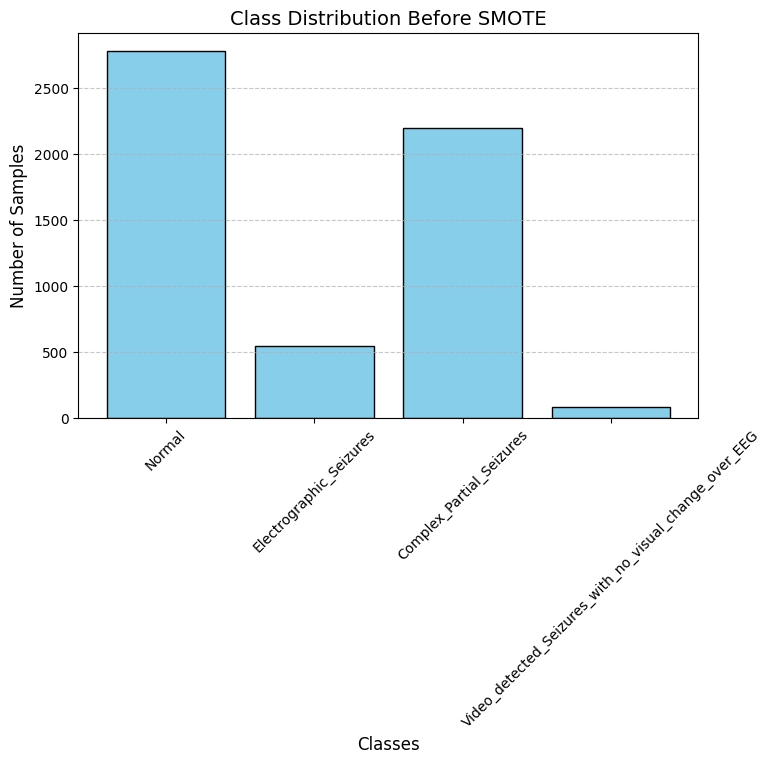

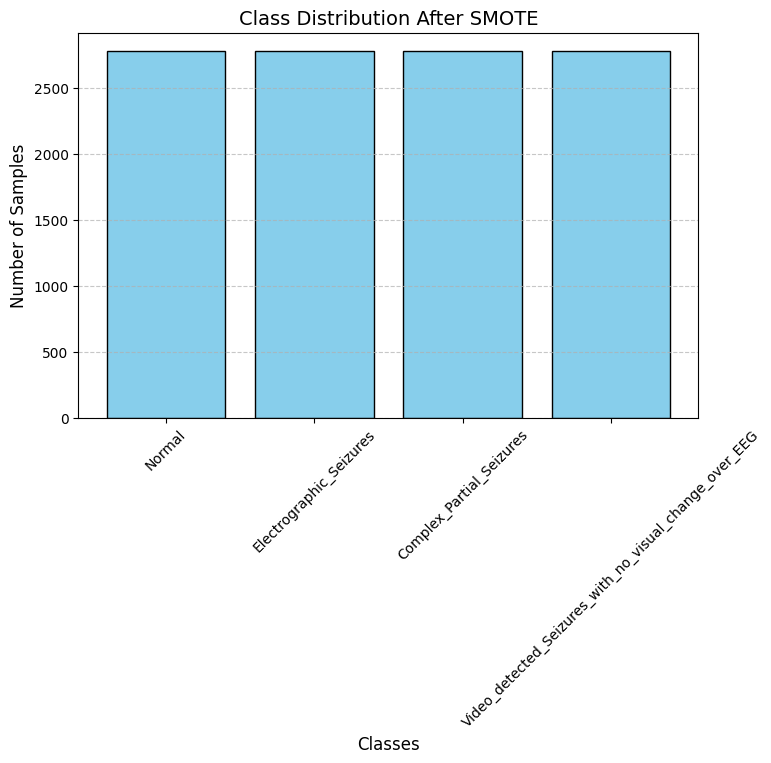

In [34]:
# Helper function to plot class distribution
def plot_class_distribution(counter, title):
    classes = list(counter.keys())
    counts = list(counter.values())

    plt.figure(figsize=(8, 5))
    plt.bar(classes, counts, color='skyblue', edgecolor='black')
    plt.title(title, fontsize=14)
    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Number of Samples', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Before SMOTE
counter_before = Counter(y)
plot_class_distribution(counter_before, 'Class Distribution Before SMOTE')

# After SMOTE
counter_after = Counter(y_sm)
plot_class_distribution(counter_after, 'Class Distribution After SMOTE')


## Feature Extraction:

## Model Selection:

In [35]:
import pandas as pd
import numpy as np
from scipy.signal import welch
from scipy.stats import entropy
import pywt

FS = 100  # Sampling frequency

def compute_fourier_features(signal):
    freqs, psd = welch(signal, fs=FS, nperseg=256)
    total_power = np.sum(psd)
    mean_freq = np.sum(freqs * psd) / total_power
    peak_freq = freqs[np.argmax(psd)]
    psd_norm = psd / np.sum(psd)
    spectral_entropy = entropy(psd_norm)
    return {
        "total_power": total_power,
        "mean_frequency": mean_freq,
        "peak_frequency": peak_freq,
        "spectral_entropy": spectral_entropy
    }

def compute_wavelet_features(signal, wavelet='db4', level=4):
    coeffs = pywt.wavedec(signal, wavelet, level=level)
    approximation = coeffs[0]
    details = coeffs[1:]
    wavelet_energy = [np.sum(np.square(detail)) for detail in details]
    energy_norm = np.array(wavelet_energy) / np.sum(wavelet_energy)
    wavelet_entropy = entropy(energy_norm)
    return {
        "wavelet_energy_level_1": wavelet_energy[0] if len(wavelet_energy) > 0 else 0,
        "wavelet_energy_level_2": wavelet_energy[1] if len(wavelet_energy) > 1 else 0,
        "wavelet_energy_level_3": wavelet_energy[2] if len(wavelet_energy) > 2 else 0,
        "wavelet_energy_level_4": wavelet_energy[3] if len(wavelet_energy) > 3 else 0,
        "wavelet_entropy": wavelet_entropy
    }

def extract_and_merge_features(data, output_file):
    final_data = []
    for class_label, class_data in data.items():
        for sample_idx, sample_data in enumerate(class_data):
            sample_features = {
                "sample": f"{class_label}_sample_{sample_idx + 1}",
                "class": class_label,
            }
            for channel_idx, channel_data in enumerate(sample_data):
                time_domain_features = compute_time_domain_features(channel_data)
                fourier_features = compute_fourier_features(channel_data)
                wavelet_features = compute_wavelet_features(channel_data)
                for feature_name, value in time_domain_features.items():
                    sample_features[f"{feature_name}_ch_{channel_idx + 1}"] = value
                for feature_name, value in fourier_features.items():
                    sample_features[f"{feature_name}_ch_{channel_idx + 1}"] = value
                for feature_name, value in wavelet_features.items():
                    sample_features[f"{feature_name}_ch_{channel_idx + 1}"] = value
            final_data.append(sample_features)
    final_df = pd.DataFrame(final_data)
    final_df.to_csv(output_file, index=False)
    print(f"All features saved to {output_file}")

# Extracting and saving all features combined
def compute_time_domain_features(channel_data):
    return {
        "mean": channel_data.mean(),
        "variance": channel_data.var(),
        "zcr": ((channel_data[:-1] * channel_data[1:]) < 0).sum(),
        "energy": (channel_data ** 2).sum(),
        "rms": (channel_data ** 2).mean() ** 0.5,
        "range": channel_data.max() - channel_data.min(),
    }

train_features = extract_and_merge_features(balanced_eeg_data, "eeg_features_combined_all.csv")
train_features

All features saved to eeg_features_combined_all.csv


In [36]:
val_features = extract_and_merge_features(validation_data, "val_eeg_features_combined_all.csv")
val_features

All features saved to val_eeg_features_combined_all.csv


In [37]:
import os
import numpy as np

def load_test_data_from_directory(directory):

    test_data_list = []


    for file_name in os.listdir(directory):
        if file_name.endswith('.npy'):
            file_path = os.path.join(directory, file_name)

            data = np.load(file_path)


            if data.shape == (19, 500):
                test_data_list.append(data)
            else:
                print(f"Skipping file {file_name} due to unexpected shape: {data.shape}")

    # Combine all loaded arrays into a single 3D numpy array
    test_data = np.stack(test_data_list, axis=0)
    return test_data

test_data_directory = "/content/EEG_Data/test_data"
test_eeg_data = load_test_data_from_directory(test_data_directory)
print(f"Loaded test data shape: {test_eeg_data.shape}")


Loaded test data shape: (779, 19, 500)


In [38]:
def extract_and_save_test_features_ndarray(test_data, output_file):

    final_data = []


    for sample_idx, sample_data in enumerate(test_data):
        sample_features = {
            "sample": f"test_sample_{sample_idx + 1}",
        }


        for channel_idx, channel_data in enumerate(sample_data):

            channel_data = channel_data.flatten()
            time_domain_features = compute_time_domain_features(channel_data)
            fourier_features = compute_fourier_features(channel_data)
            wavelet_features = compute_wavelet_features(channel_data)


            for feature_name, value in time_domain_features.items():
                sample_features[f"{feature_name}_ch_{channel_idx + 1}"] = value
            for feature_name, value in fourier_features.items():
                sample_features[f"{feature_name}_ch_{channel_idx + 1}"] = value
            for feature_name, value in wavelet_features.items():
                sample_features[f"{feature_name}_ch_{channel_idx + 1}"] = value


        final_data.append(sample_features)

    # Convert the final dataset to a DataFrame
    final_df = pd.DataFrame(final_data)

    # DataFrame to a CSV file
    final_df.to_csv(output_file, index=False)
    print(f"Test features saved to {output_file}")

In [39]:
output_file = "test_eeg_features_combined.csv"
test_output_df = extract_and_save_test_features_ndarray(test_data=test_eeg_data, output_file=output_file)

Test features saved to test_eeg_features_combined.csv


In [40]:
train_features_df = pd.read_csv('/content/eeg_features_combined_all.csv')
val_features_df = pd.read_csv('/content/val_eeg_features_combined_all.csv')
test_output_df = pd.read_csv('/content/test_eeg_features_combined.csv')

train_x = train_features_df.drop(['sample', 'class'], axis=1)
train_y = train_features_df['class']
test_data = test_output_df.drop(['sample'], axis = 1)

val_x = val_features_df.drop(['sample', 'class'], axis=1)
val_y = val_features_df['class']


In [41]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, balanced_accuracy_score, roc_auc_score
import joblib

# Create a pipeline with StandardScaler and SVM
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(kernel='rbf', gamma='scale', probability=True))
])

# Train the pipeline on the training data
pipeline.fit(train_x, train_y)

# Make predictions on the validation set
y_pred = pipeline.predict(val_x)
y_pred_proba = pipeline.predict_proba(val_x)

# Evaluate the model
print("Validation Accuracy: ", accuracy_score(val_y, y_pred))
print("Classification Report:")
print(classification_report(val_y, y_pred))

# Compute additional metrics
balanced_acc = balanced_accuracy_score(val_y, y_pred)
print("Balanced Accuracy: ", balanced_acc)

roc_auc = roc_auc_score(val_y, y_pred_proba, multi_class='ovr')
print("ROC AUC Score: ", roc_auc)

# Save the pipeline to model.h5
joblib.dump(pipeline, 'model.h5')
print("Pipeline saved to 'model.h5'")

Validation Accuracy:  0.9237348538845331
Classification Report:
                                                        precision    recall  f1-score   support

                              Complex_Partial_Seizures       0.93      0.91      0.92       549
                               Electrographic_Seizures       0.88      0.95      0.91       137
                                                Normal       0.93      0.93      0.93       696
Video_detected_Seizures_with_no_visual_change_over_EEG       0.90      0.86      0.88        21

                                              accuracy                           0.92      1403
                                             macro avg       0.91      0.91      0.91      1403
                                          weighted avg       0.92      0.92      0.92      1403

Balanced Accuracy:  0.9117649594363829
ROC AUC Score:  0.9905633526534501
Pipeline saved to 'model.h5'


In [42]:
# Load the saved pipeline
pipeline = joblib.load('model.h5')
print("Model loaded successfully!")

# Prepare the test data (exclude the 'sample' column)
test_data = test_output_df.drop(['sample'], axis=1)

# Predict the classes for test_data
test_predictions = pipeline.predict(test_data)

# Add the predictions to the test data
test_output_df['Predicted_Class'] = test_predictions

# Save the predictions to a CSV file
test_output_df[['sample', 'Predicted_Class']].to_csv('test_predictions.csv', index=False)
print("Predictions saved to 'test_predictions.csv'")


Model loaded successfully!
Predictions saved to 'test_predictions.csv'


# TASK 8: Interpretability of the Best Model

In [43]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the training features
X_train_scaled = scaler.fit_transform(train_x )

# Transform the validation features
X_val_scaled = scaler.transform(val_x)

In [44]:
from sklearn.svm import SVC, LinearSVC

# Train a linear SVM model for feature importance
linear_svm_model = LinearSVC(C=1.0, max_iter=10000, random_state=42)
linear_svm_model.fit(X_train_scaled, train_y)

# Extract feature importance from coefficients
feature_names = train_x.columns
absolute_coefficients = np.abs(linear_svm_model.coef_).mean(axis=0)
sorted_indices = np.argsort(absolute_coefficients)[::-1]
top_channels_overall = [feature_names[i] for i in sorted_indices[:3]]

print("Top 3 important channels overall:")
print(top_channels_overall)


Top 3 important channels overall:
['wavelet_energy_level_4_ch_1', 'wavelet_energy_level_4_ch_7', 'wavelet_energy_level_2_ch_2']


In [45]:
# Masking identified channels and retraining the model
masked_train_x = train_x.drop(columns=top_channels_overall)
masked_val_x = val_x.drop(columns=top_channels_overall)

# Scaling the masked data
X_train_masked_scaled = scaler.fit_transform(masked_train_x)
X_val_masked_scaled = scaler.transform(masked_val_x)

# Train and evaluate the model with masked data
masked_svm_model = SVC(kernel='rbf', gamma='scale', probability=True, random_state=42)
masked_svm_model.fit(X_train_masked_scaled, train_y)

y_pred_masked = masked_svm_model.predict(X_val_masked_scaled)
y_pred_proba_masked = masked_svm_model.predict_proba(X_val_masked_scaled) # Changed to predict_proba
roc_auc_masked = roc_auc_score(val_y, y_pred_proba_masked, multi_class='ovr')

print("\nPerformance after masking top channels:")
print("Classification Report:")
print(classification_report(val_y, y_pred_masked))
balanced_acc_masked = balanced_accuracy_score(val_y, y_pred_masked)
print("Balanced Accuracy: ", balanced_acc_masked)
roc_auc_masked = roc_auc_score(val_y, y_pred_proba_masked, multi_class='ovr')
print("ROC AUC Score: ", roc_auc_masked)



Performance after masking top channels:
Classification Report:
                                                        precision    recall  f1-score   support

                              Complex_Partial_Seizures       0.92      0.91      0.92       549
                               Electrographic_Seizures       0.88      0.94      0.91       137
                                                Normal       0.93      0.93      0.93       696
Video_detected_Seizures_with_no_visual_change_over_EEG       0.90      0.86      0.88        21

                                              accuracy                           0.92      1403
                                             macro avg       0.91      0.91      0.91      1403
                                          weighted avg       0.92      0.92      0.92      1403

Balanced Accuracy:  0.9099401419181348
ROC AUC Score:  0.990565378911549


# TASK 9: Denoising

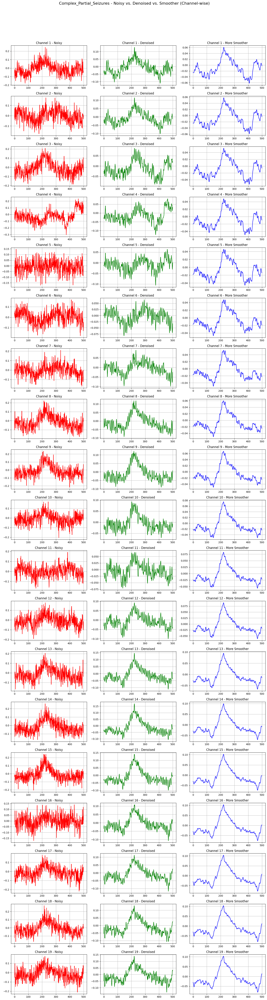

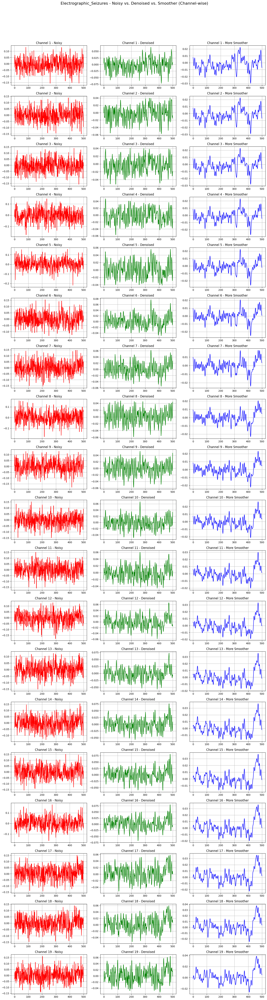

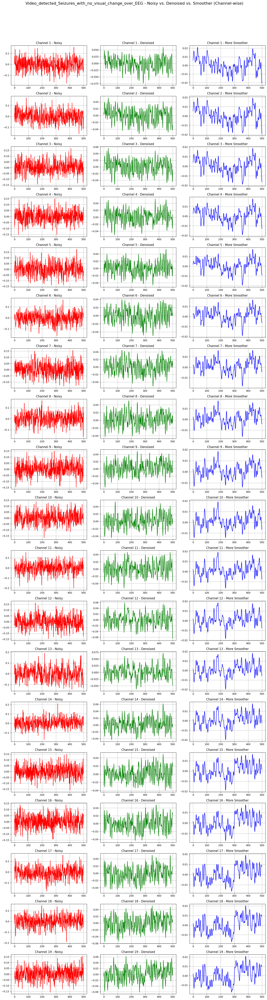

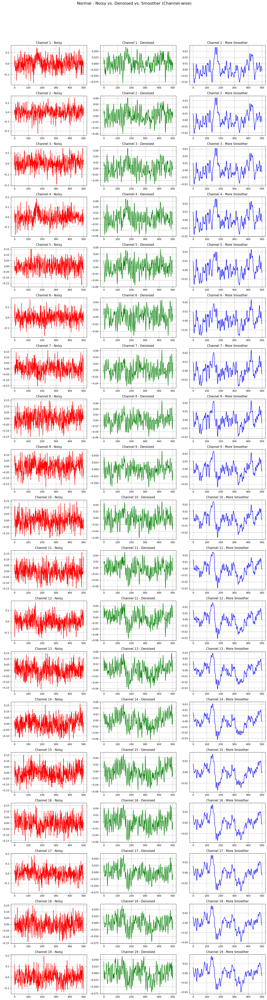

In [46]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Path to the root directory containing the noisy train data
root_dir = "/content/EEG_Data/noisy_train_data"

# Placeholder for storing the first noisy and denoised samples for each class
class_samples = {}


for subdir, _, files in os.walk(root_dir):
    class_name = os.path.basename(subdir)
    for file in files:
        if file.endswith(".npy") and class_name not in class_samples:
            file_path = os.path.join(subdir, file)

            # Load the noisy data
            noisy_data = np.load(file_path)

            # Apply a denoising method (Gaussian smoothing)
            denoised_data = gaussian_filter(noisy_data, sigma=1.0)

            # Apply stronger denoising (with higher sigma) for the third column
            smoother_data = gaussian_filter(noisy_data, sigma=3.0)

            # Store the first sample for this class
            class_samples[class_name] = (noisy_data, denoised_data, smoother_data)
            break  # Process only the first file in this class

# Plotting the noisy, denoised, and more smoothly denoised samples channel by channel
for class_name, (noisy, denoised, smoother) in class_samples.items():
    num_channels = noisy.shape[0] if noisy.ndim > 1 else 1  # Check the number of channels
    fig, axes = plt.subplots(num_channels, 3, figsize=(15, num_channels * 3))
    fig.suptitle(f"{class_name} - Noisy vs. Denoised vs. Smoother (Channel-wise)", fontsize=16)

    for channel in range(num_channels):
        # Handle single-channel case for consistent indexing
        noisy_channel = noisy[channel] if num_channels > 1 else noisy
        denoised_channel = denoised[channel] if num_channels > 1 else denoised
        smoother_channel = smoother[channel] if num_channels > 1 else smoother

        # Plot noisy sample for the channel
        axes[channel, 0].plot(noisy_channel, color='red')
        axes[channel, 0].set_title(f"Channel {channel + 1} - Noisy")
        axes[channel, 0].grid(True)

        # Plot denoised sample for the channel
        axes[channel, 1].plot(denoised_channel, color='green')
        axes[channel, 1].set_title(f"Channel {channel + 1} - Denoised")
        axes[channel, 1].grid(True)

        # Plot more smoothed sample for the channel
        axes[channel, 2].plot(smoother_channel, color='blue')
        axes[channel, 2].set_title(f"Channel {channel + 1} - More Smoother")
        axes[channel, 2].grid(True)

    # Adjust layout for the current figure
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [47]:
import os
import numpy as np
import pywt  # For wavelet-based denoising
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr

# Paths for noisy data
noisy_data_dir = '/content/EEG_Data/noisy_train_data'

def load_validation_data(directory_path):
    data = []
    labels = []

    for label in os.listdir(directory_path):
        label_dir = os.path.join(directory_path, label)
        if os.path.isdir(label_dir):
            for file in os.listdir(label_dir):
                if file.endswith('.npy'):
                    file_path = os.path.join(label_dir, file)
                    signal_data = np.load(file_path)
                    data.append(signal_data)
                    labels.append(label)
    return np.array(data), np.array(labels)


# Load validation data from validation directories
moisy_data, noisy_labels = load_validation_data('/content/EEG_Data/noisy_train_data')


In [48]:
import pywt  # For wavelet-based denoising
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr

# Paths for noisy data
noisy_data_dir = '/content/EEG_Data/noisy_train_data'

def load_validation_data(directory_path):
    data = []
    labels = []

    for label in os.listdir(directory_path):
        label_dir = os.path.join(directory_path, label)
        if os.path.isdir(label_dir):
            for file in os.listdir(label_dir):
                if file.endswith('.npy'):
                    file_path = os.path.join(label_dir, file)
                    signal_data = np.load(file_path)
                    data.append(signal_data)
                    labels.append(label)
    return np.array(data), np.array(labels)



noisy_data, noisy_labels = load_validation_data('/content/EEG_Data/noisy_train_data')

In [49]:
# Generate synthetic ground truth by applying a low-pass filter
def generate_synthetic_ground_truth(noisy_signal, cutoff=0.1):
    from scipy.signal import butter, filtfilt
    b, a = butter(3, cutoff, btype='low', analog=False)
    denoised_matrix = np.zeros_like(noisy_signal)
    for channel in range(noisy_signal.shape[0]):
        denoised_matrix[channel, :] = filtfilt(b, a, noisy_signal[channel, :])
    return denoised_matrix

# Denoising function using wavelet transform
def wavelet_denoise(signal_matrix, wavelet='db4', level=1):
    denoised_matrix = np.zeros_like(signal_matrix)
    for channel in range(signal_matrix.shape[0]):
        coeffs = pywt.wavedec(signal_matrix[channel, :], wavelet, level=level)
        threshold = np.sqrt(2 * np.log(len(coeffs[0]))) * np.median(np.abs(coeffs[1]))
        denoised_coeffs = [pywt.threshold(c, threshold, mode='soft') for c in coeffs]
        denoised_matrix[channel, :] = pywt.waverec(denoised_coeffs, wavelet)[:signal_matrix.shape[1]]
    return denoised_matrix


In [50]:
# Apply denoising and compute PSNR
print("Denoising data and calculating PSNR...")
denoised_data = []
psnr_values = []
# The 'noisy_data' variable now contains the EEG signals, not strings.
for noisy in noisy_data:
    synthetic_truth = generate_synthetic_ground_truth(noisy)
    denoised_signal = wavelet_denoise(noisy)
    denoised_data.append(denoised_signal)

    psnr_value = psnr(synthetic_truth, denoised_signal, data_range=synthetic_truth.max() - synthetic_truth.min())
    psnr_values.append(psnr_value)

# Report average PSNR
average_psnr = np.mean(psnr_values)
print(f"Average PSNR: {average_psnr:.2f} dB")

Denoising data and calculating PSNR...
Average PSNR: 22.47 dB


In [51]:
# Convert to numpy array for classification
denoised_data = np.array(denoised_data)

# Flatten the matrices for SVM input
X = denoised_data.reshape(len(denoised_data), -1)
y = noisy_labels

# Split data for training and validation
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Train SVM model
print("Training SVM classifier...")
svm_model = SVC(kernel='rbf', C=1, gamma='scale')
svm_model.fit(X_train, y_train)

# Evaluate on validation set
print("Evaluating model on validation data...")
y_pred = svm_model.predict(X_val)
print(classification_report(y_val, y_pred))


Training SVM classifier...
Evaluating model on validation data...
                                                        precision    recall  f1-score   support

                              Complex_Partial_Seizures       0.82      0.33      0.47       458
                               Electrographic_Seizures       0.00      0.00      0.00       105
                                                Normal       0.55      0.96      0.70       540
Video_detected_Seizures_with_no_visual_change_over_EEG       0.00      0.00      0.00        19

                                              accuracy                           0.60      1122
                                             macro avg       0.34      0.32      0.29      1122
                                          weighted avg       0.60      0.60      0.53      1122



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# TASK 10: Generative Modeling Techniques for Synthetic EEG Data

In [52]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import matplotlib.pyplot as plt

def load_eeg_data_from_directory(data_dir):

    data = []
    labels = []
    class_mapping = {class_name: idx for idx, class_name in enumerate(os.listdir(data_dir))}

    for class_name, label in class_mapping.items():
        class_dir = os.path.join(data_dir, class_name)
        for file_name in os.listdir(class_dir):
            if file_name.endswith('.npy'):
                file_path = os.path.join(class_dir, file_name)
                sample = np.load(file_path)
                data.append(sample)
                labels.append(label)

    return np.array(data), np.array(labels)


data_dir = "/content/EEG_Data/train_data"
real_data, real_labels = load_eeg_data_from_directory(data_dir)
print(f"Loaded data shape: {real_data.shape}, Labels shape: {real_labels.shape}")


Loaded data shape: (5608, 19, 500), Labels shape: (5608,)


In [53]:
# Define GAN Model for EEG Data Generation
def build_generator(input_dim, output_shape):
    model = models.Sequential([
        layers.Dense(128, activation='relu', input_dim=input_dim),
        layers.Dense(256, activation='relu'),
        layers.Dense(np.prod(output_shape), activation='tanh'),
        layers.Reshape(output_shape)
    ])
    return model

def build_discriminator(input_shape):
    model = models.Sequential([
        layers.Flatten(input_shape=input_shape),
        layers.Dense(256, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])
    return model


In [54]:
# Compile and Train GAN
def train_gan(generator, discriminator, real_data, epochs=5000, batch_size=64, latent_dim=100):
    # Optimizer
    optimizer = tf.keras.optimizers.Adam(0.0002, 0.5)

    discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    # Combined GAN Model
    discriminator.trainable = False
    noise_input = layers.Input(shape=(latent_dim,))
    fake_data = generator(noise_input)
    validity = discriminator(fake_data)
    gan = models.Model(noise_input, validity)
    gan.compile(optimizer=optimizer, loss='binary_crossentropy')

    # Training Loop
    for epoch in range(epochs):
        # Train Discriminator
        idx = np.random.randint(0, real_data.shape[0], batch_size)
        real_samples = real_data[idx]
        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        generated_samples = generator.predict(noise)

        real_labels = np.ones((batch_size, 1))
        fake_labels = np.zeros((batch_size, 1))

        d_loss_real = discriminator.train_on_batch(real_samples, real_labels)
        d_loss_fake = discriminator.train_on_batch(generated_samples, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # Train Generator
        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        g_loss = gan.train_on_batch(noise, np.ones((batch_size, 1)))

        if epoch % 100 == 0:
            print(f"Epoch {epoch}/{epochs} - D Loss: {d_loss[0]} - G Loss: {g_loss}")



In [55]:
# Generate Synthetic Data
def generate_synthetic_data(generator, num_samples, latent_dim):
    noise = np.random.normal(0, 1, (num_samples, latent_dim))
    synthetic_data = generator.predict(noise)
    return synthetic_data


In [56]:
# Evaluate Classifier Performance
def evaluate_classifier(real_data, real_labels, synthetic_data, synthetic_labels):
    # Split real data
    X_train_real, X_test_real, y_train_real, y_test_real = train_test_split(real_data, real_labels, test_size=0.2, random_state=42)
    X_train_syn, X_test_syn, y_train_syn, y_test_syn = train_test_split(synthetic_data, synthetic_labels, test_size=0.2, random_state=42)

    # Train on Real Data
    classifier_real = SVC()
    classifier_real.fit(X_train_real.reshape(X_train_real.shape[0], -1), y_train_real)
    y_pred_real = classifier_real.predict(X_test_real.reshape(X_test_real.shape[0], -1))
    real_acc = accuracy_score(y_test_real, y_pred_real)

    # Train on Synthetic Data
    classifier_syn = SVC()
    classifier_syn.fit(X_train_syn.reshape(X_train_syn.shape[0], -1), y_train_syn)
    y_pred_syn = classifier_syn.predict(X_test_syn.reshape(X_test_syn.shape[0], -1))
    synthetic_acc = accuracy_score(y_test_syn, y_pred_syn)

    print(f"Accuracy on Real Data: {real_acc}")
    print(f"Accuracy on Synthetic Data: {synthetic_acc}")



In [57]:
# Main Function
def main():

    # GAN Parameters
    latent_dim = 100
    output_shape = real_data.shape[1:]

    # Build Models
    generator = build_generator(latent_dim, output_shape)
    discriminator = build_discriminator(output_shape)

    # Train GAN
    train_gan(generator, discriminator, real_data, epochs= 50 , batch_size=64, latent_dim=latent_dim)

    # Generate Synthetic Data
    num_samples = real_data.shape[0]
    synthetic_data = generate_synthetic_data(generator, num_samples, latent_dim)
    synthetic_labels = real_labels

    # Evaluate Classifier
    evaluate_classifier(real_data, real_labels, synthetic_data, synthetic_labels)

if __name__ == "__main__":
    main()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step 


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:75: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0/50 - D Loss: 0.6990675926208496 - G Loss: [array(0.7071868, dtype=float32), array(0.7071868, dtype=float32), array(0.390625, dtype=float32)]
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━

** MAX RESULTS CAN BE OBTAINED IF I THE EPOCHS UPTO 10000 BUT FOR THAT MY GPU IS NOT SUPPORTING AND THE GPU ONE THAT GOOGLE COLLAB HAS IS TOKANIZED (AVAILABLE ONLY MINIMUM AMOUNT OF TIME) BECAUSE OF OVER USING IT COULD'NT USE IT AGAIN WITH IN THE TIMELINE GIVEN FOR THE HACKATHON..**